<a href="https://colab.research.google.com/github/nehach29/Flask-API-and-Streamlit-of-Detectron2-model/blob/main/Copy_of_Flask_Mask_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1><b>Flask API of Mask Detection Using Detecton - 2<br>

<br> Project Group : 4 <br>
<br> By:<br>
Neha Chaudhary <br>
Yash Kumar

<b><h1> Installing and loading necessary modules

In [ ]:
!git clone https://github.com/facebookresearch/detectron2.git

In [ ]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-secawt1q
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-secawt1q
  Resolved https://github.com/facebookresearch/detectron2.git to commit e9f7e2ba15abd7badcb05ef6f5076f06b36a9c5b
  Preparing metadata (setup.py) ... done


In [ ]:
!pip install flask-ngrok

In [ ]:
!pip install pyngrok==4.1.1

In [ ]:
!ngrok authtoken 2a4ehFCWleROHxdwX1Hs4jbZiv6_4oftNw8tzUjXn1UqWrEup

Authtoken saved to configuration file: /root/.ngrok2/ngrok.yml


In [ ]:
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2.structures import BoxMode
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.evaluation import COCOEvaluator, inference_on_dataset, LVISEvaluator
from detectron2.data import build_detection_test_loader
from detectron2.utils.logger import setup_logger
setup_logger()

import os
import cv2
import pickle
import random
from PIL import Image
import matplotlib.pyplot as plt
from flask_ngrok import run_with_ngrok
from flask import Flask,request,render_template,jsonify,send_file
from google.colab.patches import cv2_imshow

<h3><b>Registering Training images coco format

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("OD_Mask", {}, "/content/sample_train/train_.json", "/content/sample_train/images")

In [ ]:
OD_Mask_metadata = MetadataCatalog.get("OD_Mask")
dataset_dicts = DatasetCatalog.get("OD_Mask")

WARNING [12/27 09:47:59 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/27 09:47:59 d2.data.datasets.coco]: Loaded 337 images in COCO format from /content/sample_train/train_.json


<h3><b>Visualizing training images

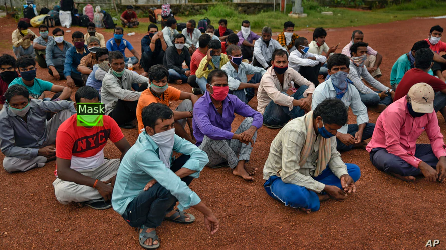

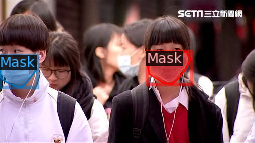

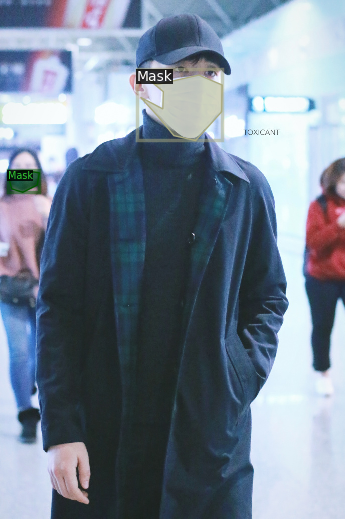

In [ ]:
import random

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=OD_Mask_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

<h3><b>Training Detectron2 detection model on custome dataset of mask detection

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file('COCO-Detection/faster_rcnn_R_50_C4_1x.yaml'))
cfg.DATASETS.TRAIN = ("OD_Mask",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url('COCO-Detection/faster_rcnn_R_50_C4_1x.yaml')
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.02
cfg.MODEL.DEVICE='cuda'
cfg.SOLVER.MAX_ITER = 500
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/27 09:48:00 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[12/27 09:48:01 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/27 09:48:16 d2.utils.events]:  eta: 0:05:29  iter: 19  total_loss: 1.444  loss_cls: 0.6353  loss_box_reg: 0.3836  loss_rpn_cls: 0.2505  loss_rpn_loc: 0.01796    time: 0.7190  last_time: 0.6787  data_time: 0.0585  last_data_time: 0.0139   lr: 0.00077924  max_mem: 2072M
[12/27 09:48:37 d2.utils.events]:  eta: 0:05:14  iter: 39  total_loss: 1.055  loss_cls: 0.2858  loss_box_reg: 0.6577  loss_rpn_cls: 0.07234  loss_rpn_loc: 0.01238    time: 0.7189  last_time: 0.6690  data_time: 0.0194  last_data_time: 0.0145   lr: 0.0015784  max_mem: 2106M
[12/27 09:48:49 d2.utils.events]:  eta: 0:04:44  iter: 59  total_loss: 0.7982  loss_cls: 0.1919  loss_box_reg: 0.5536  loss_rpn_cls: 0.04279  loss_rpn_loc: 0.0135    time: 0.6867  last_time: 0.6362  data_time: 0.0133  last_data_time: 0.0188   lr: 0.0023776  max_mem: 2107M
[12/27 09:49:01 d2.utils.events]:  eta: 0:04:26  iter: 79  total_loss: 0.69  loss_cls: 0.1705  loss_box_reg: 0.4556  loss_rpn_cls: 0.0405  loss_rpn_loc: 0.01158    time: 0.6652  las

<h3><b>Joining custom weights to the detectron model

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.75
cfg.DATASETS.TEST = ("OD_Mask", )
predictor = DefaultPredictor(cfg)

[12/27 09:53:23 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

<h3><b>Predicting the images of training using custom mask detection detectron2 model

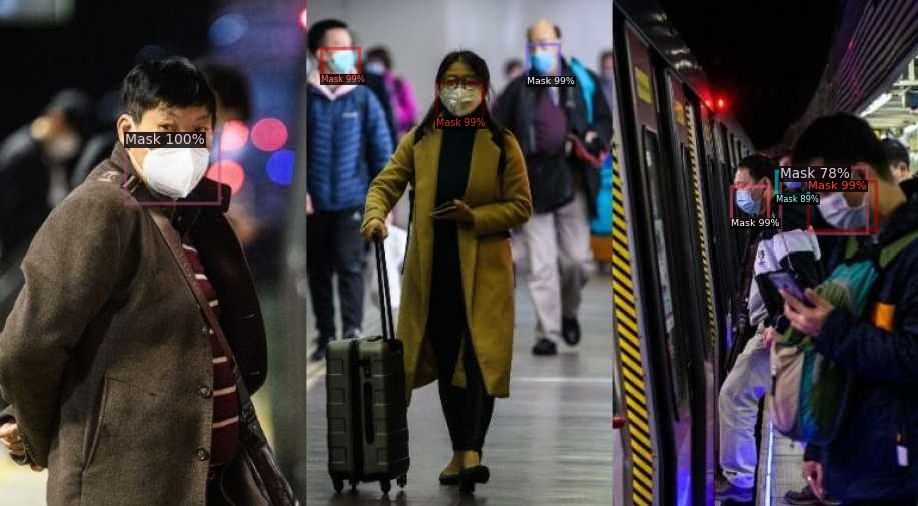

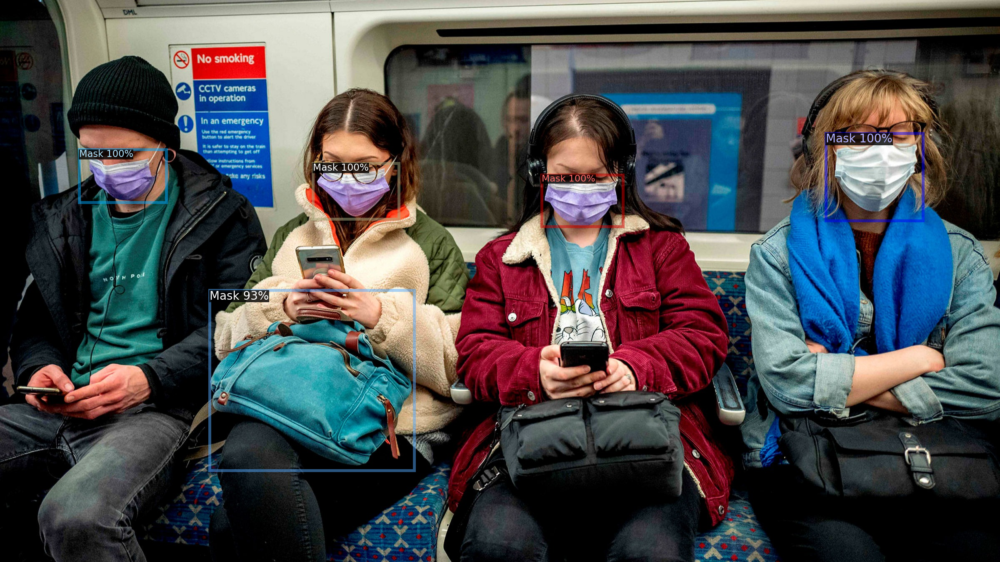

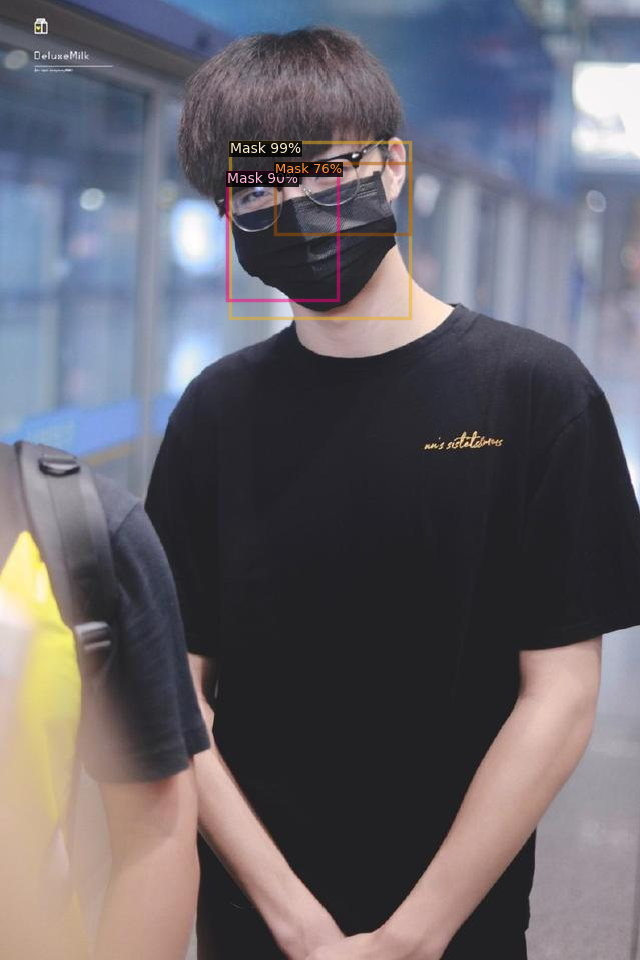

In [ ]:
for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=OD_Mask_metadata,
                   scale=1.,
                   instance_mode=ColorMode.IMAGE
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

<h2><b>Flask API for custom mask detection detectron2 model build on Flask and Python Ngrok library<br><br><h5><i><b>Please use the link which has ngrok written in its link. Example: http://2be7-34-125-28-215.ngrok-free.app

In [ ]:
app = Flask(__name__,template_folder='/content/templates')
run_with_ngrok(app)

@app.route('/')
def index():
    return render_template('index.html')

@app.route('/predict', methods=['POST'])
def predict():
    if 'file' not in request.files:
        return jsonify({'error': 'No file part'})

    file = request.files['file']

    if file.filename == '':
        return jsonify({'error': 'No selected file'})

    upload_path = 'uploads/' + file.filename
    file.save(upload_path)

    image = cv2.imread(upload_path)
    outputs = predictor(image)

    v = Visualizer(image[:, :, ::-1],
                metadata=OD_Mask_metadata,
                scale=1.,
                instance_mode=ColorMode.IMAGE)

    annotated_image = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    annotated_image.save('/content/uploads/annoted_'+file.filename)
    annotated_image = annotated_image.get_image()[:, :, ::-1]

    output_path = 'uploads/annoted_' + file.filename

    return jsonify({'annotated_image': output_path})

@app.route('/uploads/<filename>')
def uploaded_file(filename):
    return send_file('/content/uploads/' + filename, mimetype='image/jpeg')

if __name__ == '__main__':
    os.makedirs('uploads', exist_ok=True)

    app.run()

 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit


 * Running on http://2be7-34-125-28-215.ngrok-free.app
 * Traffic stats available on http://127.0.0.1:4040


INFO:werkzeug:127.0.0.1 - - [27/Dec/2023 10:14:46] "GET / HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [27/Dec/2023 10:14:47] "GET /favicon.ico HTTP/1.1" 404 -
INFO:werkzeug:127.0.0.1 - - [27/Dec/2023 10:15:00] "POST /predict HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [27/Dec/2023 10:15:00] "GET /uploads/annoted_8.jpg HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [27/Dec/2023 10:15:38] "POST /predict HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [27/Dec/2023 10:15:38] "GET /uploads/annoted_000_1OC3DT.jpg HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [27/Dec/2023 10:15:56] "POST /predict HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [27/Dec/2023 10:15:57] "GET /uploads/annoted_2bd1431c-e585-4faf-b54c-0c25ae00d725.jpg HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [27/Dec/2023 10:16:16] "POST /predict HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [27/Dec/2023 10:16:17] "GET /uploads/annoted_89.jpg HTTP/1.1" 200 -
